<a href="https://colab.research.google.com/github/nvancha/DS_Hackathon-/blob/main/GROUP_24_M4_Hackathon_Cirrhosis_Production.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**BLUF**
##**Group members - Nipuna Vancha and Amina Seini**
##**GROUP - 24**
From the Low code PyCaret Classification analysis we concluded Logistic Regression Classifier to be the best classifier because upon looking at the Learning curve, the training score and cross validation score come the closest compared the rest of the classifiers even though Logistic Regression Classifier doesn’t have the highet AUC of 0.7647	 or Accuracy of 0.7224, its average at best compared to other classifiers.

From the classifier horserace
1.  We chose XG Boost classifier as its the classifier with the highest average accuracy, i.e. 0.749 balanced accuracy, i.e. 0.713, and AUC, i.e. 0.713. We are considering the Accuracy metric over AUC because it is a commonly used metric for classification problems and it considers both true positives and true negatives for its calculation. The best combination of hyperparameters found during the grid search for the XGBoost classifier, as well as the optimal pipeline with these hyperparameters.

2.  The best hyperparameters for the XGBoost classifier are, gamma: 1, learning_rate: 0.1, max_depth: 2, n_estimators: 140. The optimal pipeline consists of, SMOTE for handling class imbalance, StandardScaler for feature scaling, An XGBoost classifier with the above-mentioned best hyperparameters.

3.   The majority class (class 1) has 723 samples, while the minority class (class 0) has 77 samples. This shows that the dataset is imbalanced.

4.   Both classes have an equal number of samples (723 for class 0 and 723 for class 1). This indicates that the minority class (class 0) has been oversampled using SMOTE to balance the dataset.

5.   Both classes have an equal number of samples (77 for class 0 and 77 for class 1). This indicates that the majority class (class 1) has been undersampled using RandomUnderSampler to balance the dataset.
The data is both oversampled and undersampled. SMOTE was used to oversample the minority class, while RandomUnderSampler was used to undersample the majority class. As a result, the dataset was balanced through a combination of oversampling and undersampling.

6.   Here, class 0 is the minority class, and class 1 is the majority class and the number of samples belonging to class 0 is 11% of the number of samples belonging to class 1.

7.   From the confusion matrix we found out that there are 177 TP (True Positives), 22 TN (True Negatives), 1 FP (False Positives) and 0 FN (False Negatives). The accuracy of this model is 0.995, or 99.5%.

8.   According to the study, in the test dataset of size 200, 80% of the first 176 instances rank-ordered by propensity are positive actuals, and 88.0 percent of the rank-ordered data should be taken as leads.

9. We have noticed in the Learning curve for XG Boost classifier that the training score and cross validation score are almost parallel to each other. This might be evident that this is not the best classifier even thought it has highest accuracy.


#**Business Problem**

Cirrhosis is a late stage of scarring (fibrosis) of the liver caused by many forms of liver diseases and conditions, such as hepatitis and chronic alcoholism. The following data contains the information collected from the Mayo Clinic trial in primary biliary cirrhosis (PBC) of the liver conducted between 1974 and 1984. A description of the clinical background for the trial and the covariates recorded here is in Chapter 0, especially Section 0.2 of Fleming and Harrington, Counting
Processes and Survival Analysis, Wiley, 1991. A more extended discussion can be found in Dickson, et al., Hepatology 10:1-7 (1989) and in Markus, et al., N Eng J of Med 320:1709-13 (1989).

A total of 424 PBC patients, referred to Mayo Clinic during that ten-year interval, met eligibility criteria for the randomized placebo-controlled trial of the drug D-penicillamine. The first 312 cases in the dataset participated in the randomized trial and contain largely complete data. The additional 112 cases did not participate in the clinical trial but consented to have basic measurements recorded and to be followed for survival. Six of those cases were lost to follow-up shortly after diagnosis, so the data here are on an additional 106 cases as well as the 312 randomized participants.

Develop a classfier to predict whether a patient will suffer from cirrhosis or not?

![cirr info](https://preferredresearchpartners.com/build/wp-content/uploads/2017/11/Cirrhosis-fact-sheet-PRP.jpg)

#**M4 Hackathon Checklist**

For the M4 hackathon, using the data described in class, document and compare the performance of:

The best "code" (i.e., using scikit-learn or similar libraries) classifier that you can find.
The best "low-code" (i.e., PyCaret), using/adapting the code provided.
Notes:

Decide if undersampling/oversampling is needed, and to implement it, if so.
implement a validation strategy. Also decide and implement a validation strategy.  Use learning curves to determine if your classifiers are overfitted.


#**Libraries**

In [ ]:
!pip install -q pycaret autoviz --upgrade psynlig
from pycaret.classification import *

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 481.8/481.8 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.4/67.4 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.1/16.1 MB 37.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.4/46.4 kB 837.1 kB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.2/212.2 kB 17.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.0/150.0 kB 12.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.8/105.8 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.2/81.2 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━

In [ ]:
from pycaret.classification import setup
from pycaret.classification import tune_model
from pycaret.classification import setup
from pycaret.classification import compare_models
from pycaret.classification import *


In [ ]:
from autoviz.AutoViz_Class import AutoViz_Class

Imported v0.1.601. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


In [ ]:
import sklearn                                          # Sci-Kit Learn library (most important machine learning library in Python)
from sklearn import datasets                            # Imports some toy daatsets embedded in the sklean library
from sklearn.preprocessing import StandardScaler        # Used to standardize a column of data (i.e., create z scores)
from sklearn.linear_model import Perceptron             # Implementation of the Perceptron algorithm in sklearn
from sklearn.metrics import accuracy_score              # Used to compute the accuracy of a machine learning classifier
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [ ]:
# Basic libraries
%matplotlib inline
import pandas as pd
from psynlig import pca_explained_variance_bar
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats.mstats import winsorize
from sklearn.preprocessing import OneHotEncoder
import scipy.stats as ss
import math
from matplotlib.colors import ListedColormap

In [ ]:
# sklearn
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score, log_loss, balanced_accuracy_score, f1_score
from sklearn.model_selection import cross_val_score
from sklearn.inspection import partial_dependence
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import permutation_importance

In [ ]:
# mblearn library
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as imbpipeline
from sklearn.pipeline import Pipeline
from sklearn.datasets import make_classification

#*Data Dictionary*
1) ID: unique identifier

2) N_Days: number of days between registration and the earlier of death, transplantation, or study analysis time in July 1986

3) Status: status of the patient C (censored), CL (censored due to liver tx), or D (death)

4) Drug: type of drug D-penicillamine or placebo

5) Age: age in [days]

6) Sex: M (male) or F (female)

7) Ascites: presence of ascites N (No) or Y (Yes)

8) Hepatomegaly: presence of hepatomegaly N (No) or Y (Yes)

9) Spiders: presence of spiders N (No) or Y (Yes)

10) Edema: presence of edema N (no edema and no diuretic therapy for edema), S (edema present without diuretics, or edema resolved by diuretics), or Y (edema despite diuretic therapy)

11) Bilirubin: serum bilirubin in [mg/dl]

12) Cholesterol: serum cholesterol in [mg/dl]

13) Albumin: albumin in [gm/dl]

14) Copper: urine copper in [ug/day]

15) Alk_Phos: alkaline phosphatase in [U/liter]

16) SGOT: SGOT in [U/ml]

17) Triglycerides: triglicerides in [mg/dl]

18) Platelets: platelets per cubic [ml/1000]

19) Prothrombin: prothrombin time in seconds [s]

20) Stage: histologic stage of disease (1, 2, 3, or 4)

#**Data**

In [ ]:
# Read
# File: https://drive.google.com/file/d/18eEu3LBKhRi1lY6n8Ch5saoeqKSuaGb-/view?usp=share_link
url = 'https://drive.google.com/uc?id=18eEu3LBKhRi1lY6n8Ch5saoeqKSuaGb-'

# Read in the dataset
df = pd.read_csv(url)

In [ ]:
df

,ID,N_Days,Status,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,1,400,D,D-penicillamine,21464,F,Y,Y,Y,Y,14.5,261.0,2.60,156.0,1718.0,137.95,172.0,190.0,12.2,4.0
1,2,4500,C,D-penicillamine,20617,F,N,Y,Y,N,1.1,302.0,4.14,54.0,7394.8,113.52,88.0,221.0,10.6,3.0
2,3,1012,D,D-penicillamine,25594,M,N,N,N,S,1.4,176.0,3.48,210.0,516.0,96.10,55.0,151.0,12.0,4.0
3,4,1925,D,D-penicillamine,19994,F,N,Y,Y,S,1.8,244.0,2.54,64.0,6121.8,60.63,92.0,183.0,10.3,4.0
4,5,1504,CL,Placebo,13918,F,N,Y,Y,N,3.4,279.0,3.53,143.0,671.0,113.15,72.0,136.0,10.9,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
413,414,681,D,NaN,24472,F,NaN,NaN,NaN,N,1.2,NaN,2.96,NaN,NaN,NaN,NaN,174.0,10.9,3.0
414,415,1103,C,NaN,14245,F,NaN,NaN,NaN,N,0.9,NaN,3.83,NaN,NaN,NaN,NaN,180.0,11.2,4.0
415,416,1055,C,NaN,20819,F,NaN,NaN,NaN,N,1.6,NaN,3.42,NaN,NaN,NaN,NaN,143.0,9.9,3.0
416,417,691,C,NaN,21185,F,NaN,NaN,NaN,N,0.8,NaN,3.75,NaN,NaN,NaN,NaN,269.0,10.4,3.0


#**M2: Exploratory Data Analysis**

In [ ]:
# Shape of df
print("Shape", df.shape)

# Check data types
print(df.info())

Shape (418, 20)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ID             418 non-null    int64  
 1   N_Days         418 non-null    int64  
 2   Status         418 non-null    object 
 3   Drug           312 non-null    object 
 4   Age            418 non-null    int64  
 5   Sex            418 non-null    object 
 6   Ascites        312 non-null    object 
 7   Hepatomegaly   312 non-null    object 
 8   Spiders        312 non-null    object 
 9   Edema          418 non-null    object 
 10  Bilirubin      418 non-null    float64
 11  Cholesterol    284 non-null    float64
 12  Albumin        418 non-null    float64
 13  Copper         310 non-null    float64
 14  Alk_Phos       312 non-null    float64
 15  SGOT           312 non-null    float64
 16  Tryglicerides  282 non-null    float64
 17  Platelets      407 non-null    float64

In [ ]:
df.head()

,ID,N_Days,Status,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,1,400,D,D-penicillamine,21464,F,Y,Y,Y,Y,14.5,261.0,2.60,156.0,1718.0,137.95,172.0,190.0,12.2,4.0
1,2,4500,C,D-penicillamine,20617,F,N,Y,Y,N,1.1,302.0,4.14,54.0,7394.8,113.52,88.0,221.0,10.6,3.0
2,3,1012,D,D-penicillamine,25594,M,N,N,N,S,1.4,176.0,3.48,210.0,516.0,96.10,55.0,151.0,12.0,4.0
3,4,1925,D,D-penicillamine,19994,F,N,Y,Y,S,1.8,244.0,2.54,64.0,6121.8,60.63,92.0,183.0,10.3,4.0
4,5,1504,CL,Placebo,13918,F,N,Y,Y,N,3.4,279.0,3.53,143.0,671.0,113.15,72.0,136.0,10.9,3.0


In [ ]:
df.columns

Index(['ID', 'N_Days', 'Status', 'Drug', 'Age', 'Sex', 'Ascites',
       'Hepatomegaly', 'Spiders', 'Edema', 'Bilirubin', 'Cholesterol',
       'Albumin', 'Copper', 'Alk_Phos', 'SGOT', 'Tryglicerides', 'Platelets',
       'Prothrombin', 'Stage'],
      dtype='object')

In [ ]:
# Drop ID, Customer_ID and SSN columns
df = df.drop(['ID'], axis=1)

In [ ]:
df.head()

,N_Days,Status,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,400,D,D-penicillamine,21464,F,Y,Y,Y,Y,14.5,261.0,2.60,156.0,1718.0,137.95,172.0,190.0,12.2,4.0
1,4500,C,D-penicillamine,20617,F,N,Y,Y,N,1.1,302.0,4.14,54.0,7394.8,113.52,88.0,221.0,10.6,3.0
2,1012,D,D-penicillamine,25594,M,N,N,N,S,1.4,176.0,3.48,210.0,516.0,96.10,55.0,151.0,12.0,4.0
3,1925,D,D-penicillamine,19994,F,N,Y,Y,S,1.8,244.0,2.54,64.0,6121.8,60.63,92.0,183.0,10.3,4.0
4,1504,CL,Placebo,13918,F,N,Y,Y,N,3.4,279.0,3.53,143.0,671.0,113.15,72.0,136.0,10.9,3.0


In [ ]:
# Feature Types
quant_features = ['Age',
       'N_Days', 'Bilirubin', 'Cholesterol', 'Albumin', 'Copper', 'Alk_Phos', 'SGOT', 'Tryglicerides', 'Platelets', 'Prothrombin']
categorical_features = ['Drug','Sex','Ascites','Hepatomegaly', 'Spiders', 'Edema', 'Status']
target = ['Stage']


In [ ]:
# get unique values of the target ('Credit_Score')
for feature in ['Status']:
  unique_values = df[feature].unique()
  print(feature,unique_values)

Status ['D' 'C' 'CL']


In [ ]:
df

,N_Days,Status,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,400,D,D-penicillamine,21464,F,Y,Y,Y,Y,14.5,261.0,2.60,156.0,1718.0,137.95,172.0,190.0,12.2,4.0
1,4500,C,D-penicillamine,20617,F,N,Y,Y,N,1.1,302.0,4.14,54.0,7394.8,113.52,88.0,221.0,10.6,3.0
2,1012,D,D-penicillamine,25594,M,N,N,N,S,1.4,176.0,3.48,210.0,516.0,96.10,55.0,151.0,12.0,4.0
3,1925,D,D-penicillamine,19994,F,N,Y,Y,S,1.8,244.0,2.54,64.0,6121.8,60.63,92.0,183.0,10.3,4.0
4,1504,CL,Placebo,13918,F,N,Y,Y,N,3.4,279.0,3.53,143.0,671.0,113.15,72.0,136.0,10.9,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
413,681,D,NaN,24472,F,NaN,NaN,NaN,N,1.2,NaN,2.96,NaN,NaN,NaN,NaN,174.0,10.9,3.0
414,1103,C,NaN,14245,F,NaN,NaN,NaN,N,0.9,NaN,3.83,NaN,NaN,NaN,NaN,180.0,11.2,4.0
415,1055,C,NaN,20819,F,NaN,NaN,NaN,N,1.6,NaN,3.42,NaN,NaN,NaN,NaN,143.0,9.9,3.0
416,691,C,NaN,21185,F,NaN,NaN,NaN,N,0.8,NaN,3.75,NaN,NaN,NaN,NaN,269.0,10.4,3.0


In [ ]:
# count NaNs
df.isna().sum()

N_Days             0
Status             0
Drug             106
Age                0
Sex                0
Ascites          106
Hepatomegaly     106
Spiders          106
Edema              0
Bilirubin          0
Cholesterol      134
Albumin            0
Copper           108
Alk_Phos         106
SGOT             106
Tryglicerides    136
Platelets         11
Prothrombin        2
Stage              6
dtype: int64

In [ ]:
# Identify duplicates (dups)
df.duplicated().sum()

0

In [ ]:
# summary
df.describe()

,N_Days,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
count,418.000000,418.000000,418.000000,284.000000,418.000000,310.000000,312.000000,312.000000,282.000000,407.000000,416.000000,412.000000
mean,1917.782297,18533.351675,3.220813,369.510563,3.497440,97.648387,1982.655769,122.556346,124.702128,257.024570,10.731731,3.024272
std,1104.672992,3815.845055,4.407506,231.944545,0.424972,85.613920,2140.388824,56.699525,65.148639,98.325585,1.022000,0.882042
min,41.000000,9598.000000,0.300000,120.000000,1.960000,4.000000,289.000000,26.350000,33.000000,62.000000,9.000000,1.000000
25%,1092.750000,15644.500000,0.800000,249.500000,3.242500,41.250000,871.500000,80.600000,84.250000,188.500000,10.000000,2.000000
50%,1730.000000,18628.000000,1.400000,309.500000,3.530000,73.000000,1259.000000,114.700000,108.000000,251.000000,10.600000,3.000000
75%,2613.500000,21272.500000,3.400000,400.000000,3.770000,123.000000,1980.000000,151.900000,151.000000,318.000000,11.100000,4.000000
max,4795.000000,28650.000000,28.000000,1775.000000,4.640000,588.000000,13862.400000,457.250000,598.000000,721.000000,18.000000,4.000000


In [ ]:
# create an AutoViz class
AV = AutoViz_Class()

Shape of your Data Set loaded: (418, 19)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nullpercent,NuniquePercent,dtype,Nuniques,Nulls,Least num. of categories,Data cleaning improvement suggestions
Tryglicerides,32.535885,34.928230,float64,146,136,0,"fill missing values, right skewed distribution: cap or drop outliers"
Cholesterol,32.057416,48.086124,float64,201,134,0,"fill missing values, right skewed distribution: cap or drop outliers"
Copper,25.837321,37.799043,float64,158,108,0,"fill missing values, right skewed distribution: cap or drop outliers"
Drug,25.358852,0.478469,object,2,106,154,"fill missing values, fix mixed data types"
Ascites,25.358852,0.478469,object,2,106,24,"fill missing values, fix mixed data types"
Hepatomegaly,25.358852,0.478469,object,2,106,152,"fill missing values, fix mixed data types"
Spiders,25.358852,0.478469,object,2,106,90,"fill missing values, fix mixed data types"
SGOT,25.358852,42.822967,float64,179,106,0,"fill missing values, right skewed distribution: cap or drop outliers"
Alk_Phos,25.358852,70.574163,float64,295,106,0,"fill missing values, right skewed distribution: cap or drop outliers"
Platelets,2.631579,58.133971,float64,243,11,0,fill missing values


    18 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Multi_Classification problem #####################


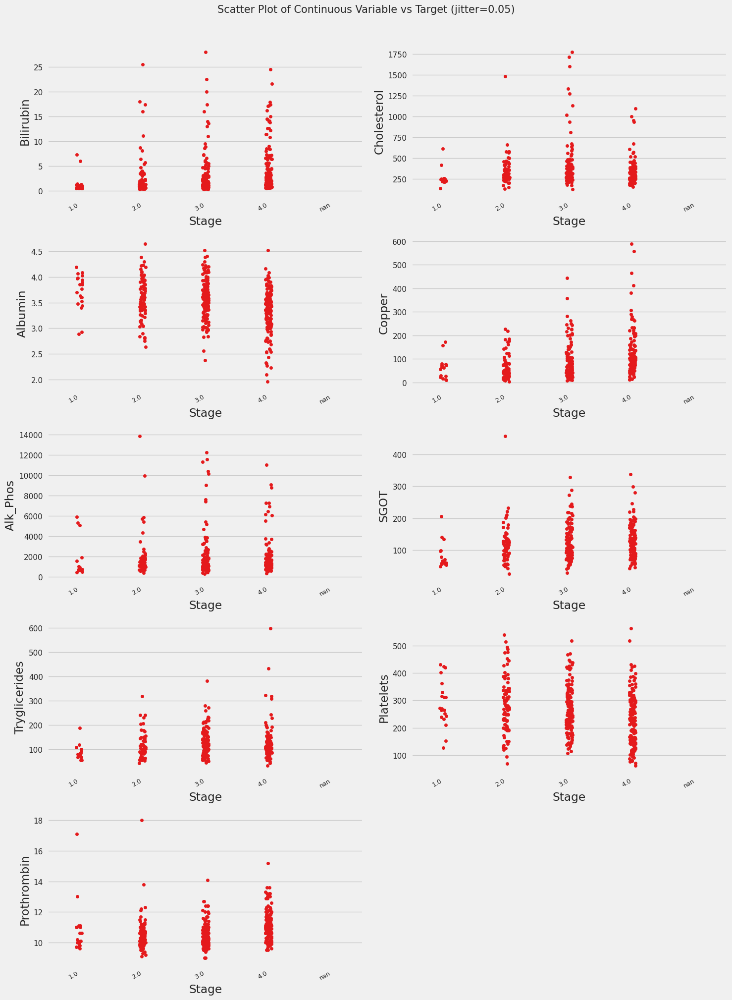

Total Number of Scatter Plots = 45


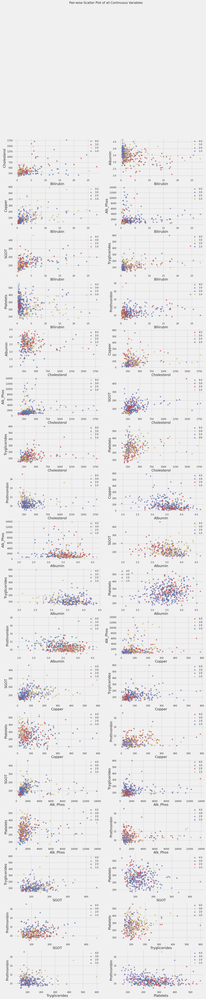

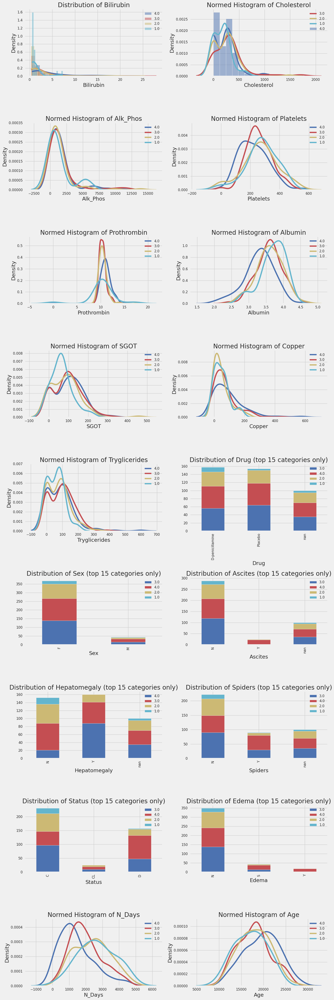

Could not draw some Distribution Plots


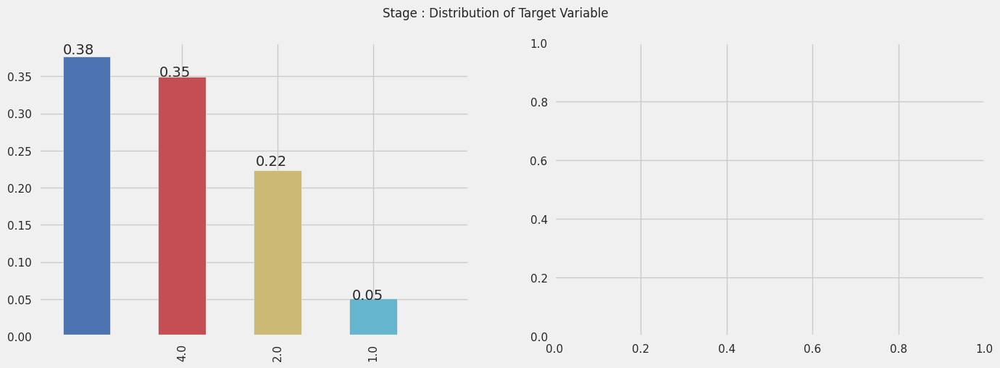

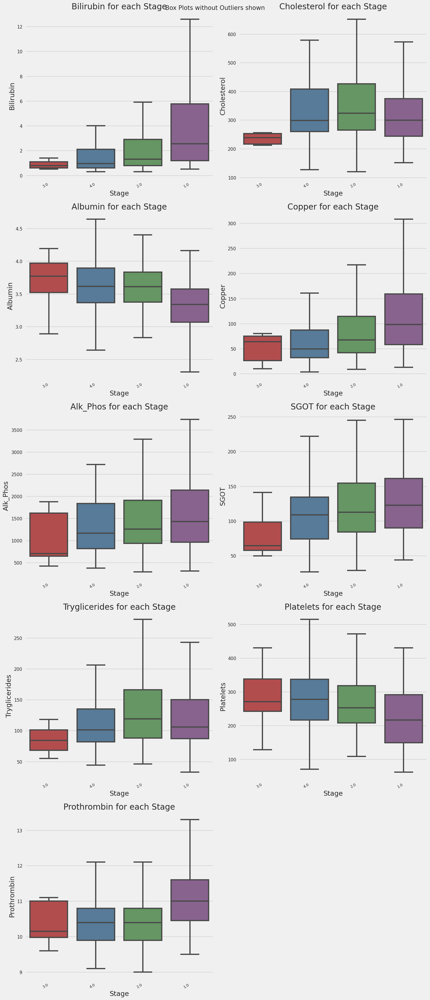

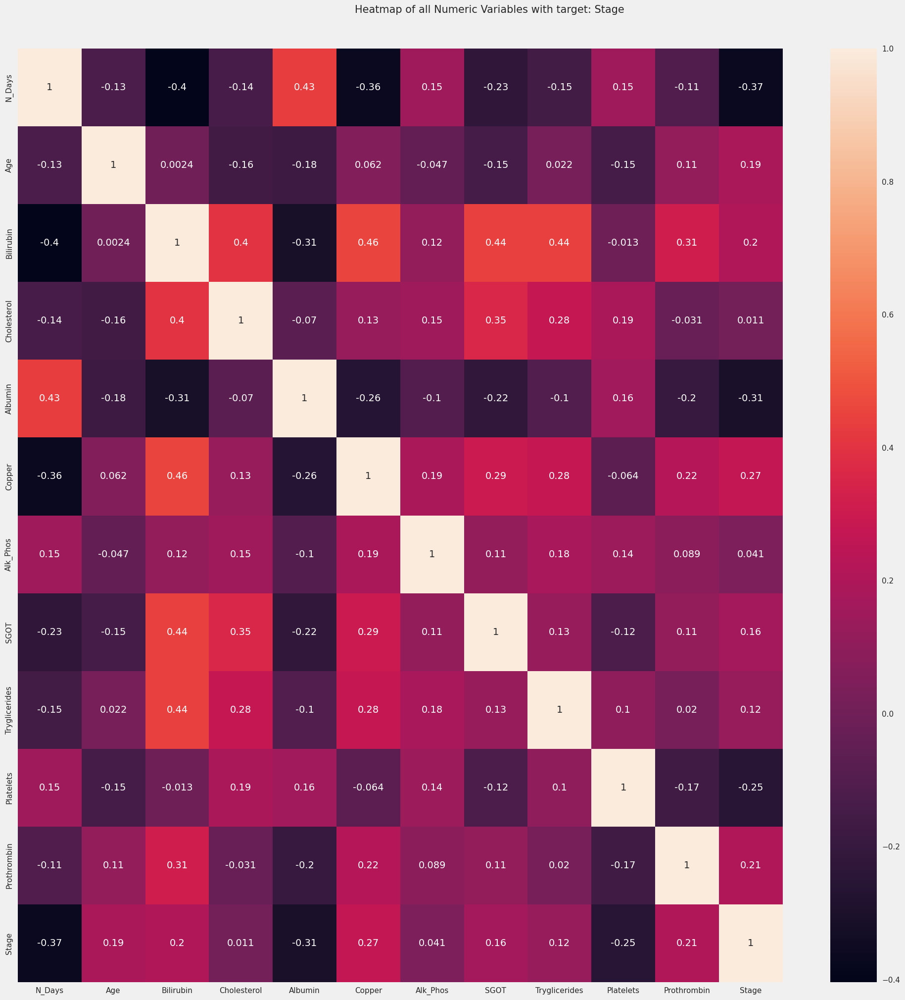

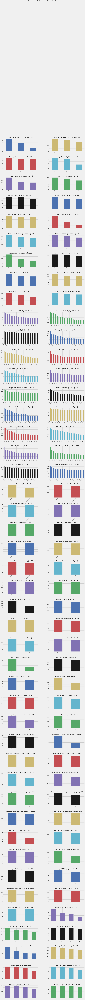

All Plots done
Time to run AutoViz = 60 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [ ]:
# create charts
%matplotlib inline
dftc = AV.AutoViz(filename='', sep ='' , depVar = 'Stage', dfte = df, header = 0,
verbose = 1, lowess = False, chart_format ='png', max_rows_analyzed = 2000, max_cols_analyzed = 30)

# **M3: Preprocessing**

##*Missing Values*

In [ ]:
# Missing Values
for feature in quant_features:
  df[feature].fillna(0, inplace=True)   # Replace NaNs in selected columns with zeroes
df['Drug'].fillna('0', inplace=True)   # Replace NaNs in selected columns with zeroes
df['Ascites'].fillna('0', inplace=True)   # Replace NaNs in selected columns with zeroes
df['Hepatomegaly'].fillna('0', inplace=True)   # Replace NaNs in selected columns with zeroes
df['Spiders'].fillna('0', inplace=True)   # Replace NaNs in selected columns with zeroes


##*Encoding Target*

In [ ]:
# Encode categorical target variable
# we want 2 target values instead of 4
# 0 means no cirrhosis
# 1 means cirrhosis
#replace stage 4 as 1(positive) and rest of the stages in to 0(negative)
df['Stage'] = np.where(df['Stage'] == 4,1,0)
df.shape

(418, 19)

In [ ]:
# pick numerical variables and set them as X
for feature in quant_features:
  df[feature]=pd.to_numeric(df[feature], errors='coerce')
X = df[quant_features]

##*Skewness*

In [ ]:
from scipy.stats import skew
skewness = X.apply(lambda x: skew(x))
cols_to_transform = skewness[skewness > 1].index
X[cols_to_transform] = np.log1p(X[cols_to_transform])

##*Outliers*

In [ ]:
# Tukey Rule outliers
# As an alternative, you could use z-scores greater than 3 or less than -3.

#Tukey's method
def tukey_rule(data, col):
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    upper_lim = data[col].quantile(0.5) + 2 * IQR
    lower_lim = data[col].quantile(0.5) - 2 * IQR
    outliers = []
    for index, x in enumerate(data[col]):
        if x < lower_lim or x >= upper_lim:
            outliers.append(index)
    return outliers

# Identify outliers
for i in quant_features:
  outliers_Tukey = tukey_rule(X,i)

# Winsorize X and check the results
X_winsorized = X.copy(deep=True)
for i in quant_features:
  X_winsorized[i] = winsorize(X[i], limits=(0.05, 0.05))

In [ ]:
# Update result df with winzorized quant features

def winzorized(self):
  for ls in self:
    df[ls]=X_winsorized[ls]

winzorized(quant_features)

In [ ]:
for feature in quant_features:
  df[feature].fillna(0, inplace=True)   # Replace NaNs in selected columns with zeroes

##*Dummy Encoding*

In [ ]:
# Encode the categoricals
df = pd.get_dummies(data=df, columns=categorical_features, drop_first=True)

##*Feature Importance*

In [ ]:
# Feature Importance
# Load your dataset and split into features (X) and target (y)
X = df.drop(['Stage'],axis=1)               # Here we drop the target from the results dataframe. axis = 1 refers to the "feature axis". X is a dataframe containing the predictors
y = df ['Stage']

# Initialize the Random Forest Classifier
rfc = RandomForestClassifier()

# Train the model on your dataset
rfc.fit(X, y)

# Extract feature importances from the model
importances = rfc.feature_importances_

# Sort the feature importances in descending order
indices = np.argsort(importances)[::-1]

Text(0.5, 1.0, 'Feature importance for classification dataset')

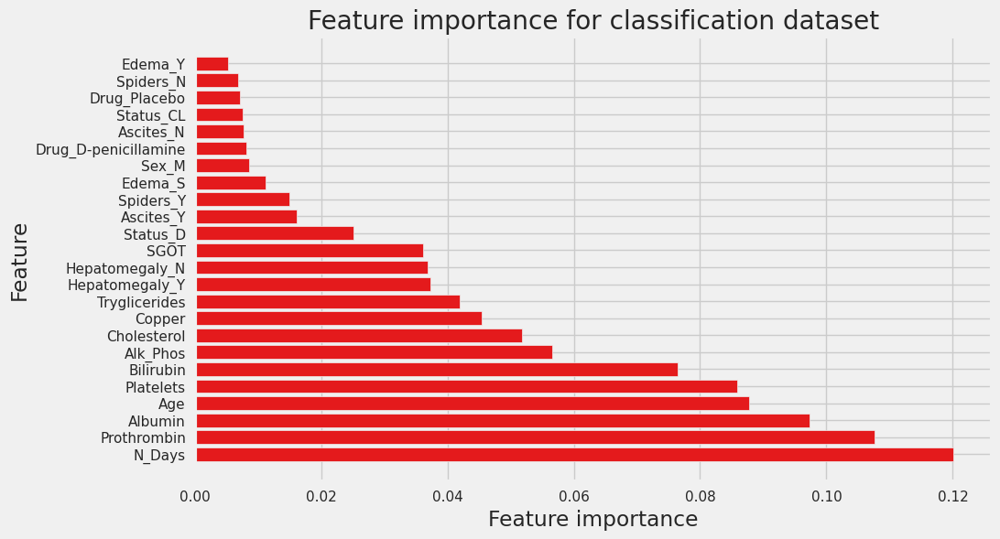

In [ ]:
# Create a bar chart of feature importances
plt.figure(figsize=(10, 6))
plt.barh(range(X.shape[1]), importances[indices], align='center')
plt.yticks(range(X.shape[1]), X.columns[indices])
plt.xlabel("Feature importance")
plt.ylabel("Feature")
plt.title("Feature importance for classification dataset")

In [ ]:
X.columns

Index(['N_Days', 'Age', 'Bilirubin', 'Cholesterol', 'Albumin', 'Copper',
       'Alk_Phos', 'SGOT', 'Tryglicerides', 'Platelets', 'Prothrombin',
       'Drug_D-penicillamine', 'Drug_Placebo', 'Sex_M', 'Ascites_N',
       'Ascites_Y', 'Hepatomegaly_N', 'Hepatomegaly_Y', 'Spiders_N',
       'Spiders_Y', 'Edema_S', 'Edema_Y', 'Status_CL', 'Status_D'],
      dtype='object')

In [ ]:
X=X[['N_Days','Prothrombin', 'Albumin', 'Age', 'Platelets', 'Bilirubin', 'Cholesterol','Copper',
       'Alk_Phos',]]

##*Balance*

In [ ]:
# Balance of the dataset
y.mean()

0.3444976076555024

##*Pairplot*

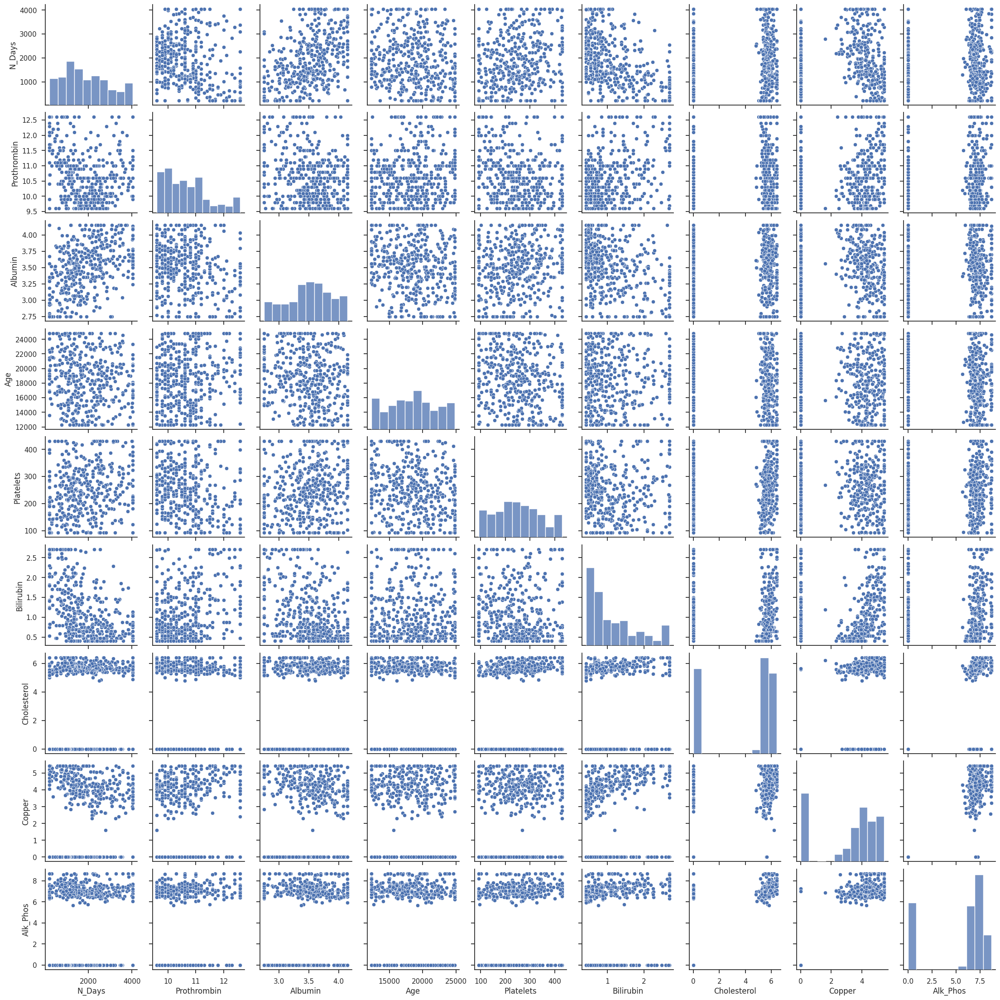

In [ ]:
# Scatterplot matrix - these can take some time to gerenerate if the number of features is large
sns.set_theme(style="ticks")
sns.pairplot(X)

##*Principal Components Analysis (PCA)*

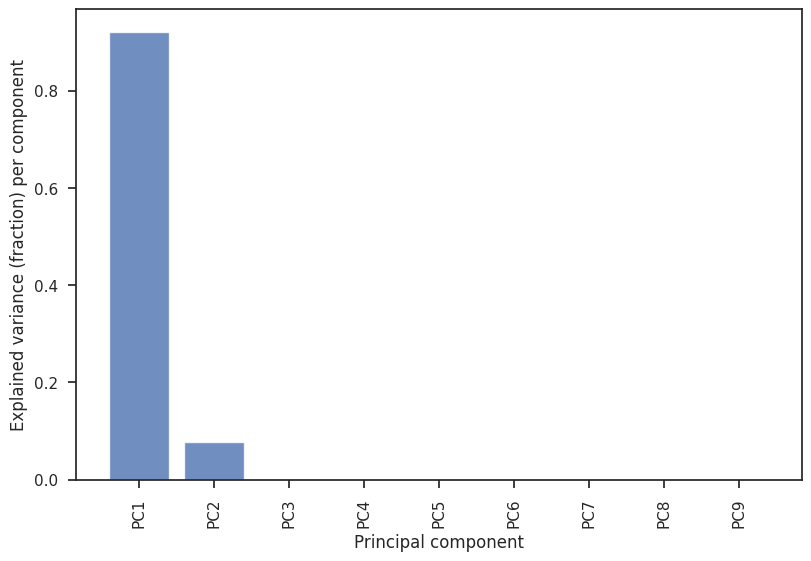

In [ ]:
# Principal Components Analysis
# Examine the explained variance ratio in order for each components
pca = PCA()
X_winsorized_pca = pca.fit_transform(X)
pca.explained_variance_ratio_

pca_explained_variance_bar(pca, alpha=0.8)
plt.show()

# This suggests that we may be able to use two or three (and certainly no more than 6 pricipal components) to build models

In [ ]:
# Pairplot the principal component data
import plotly.express as px
components = pca.fit_transform(X)
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(4),
    color=df["Stage"]
)
fig.update_traces(diagonal_visible=False)
fig.show()

In [ ]:
x1_train, x1_test,y1_train,y1_test = train_test_split(X,y, test_size=0.2, random_state=0)

In [ ]:
df.columns

Index(['N_Days', 'Age', 'Bilirubin', 'Cholesterol', 'Albumin', 'Copper',
       'Alk_Phos', 'SGOT', 'Tryglicerides', 'Platelets', 'Prothrombin',
       'Stage', 'Drug_D-penicillamine', 'Drug_Placebo', 'Sex_M', 'Ascites_N',
       'Ascites_Y', 'Hepatomegaly_N', 'Hepatomegaly_Y', 'Spiders_N',
       'Spiders_Y', 'Edema_S', 'Edema_Y', 'Status_CL', 'Status_D'],
      dtype='object')

##*Recursive Feature Elimination (RFE)*

In [ ]:
from sklearn.feature_selection import RFE
rfe = RFE(estimator=RandomForestClassifier(), n_features_to_select=5)
_ = rfe.fit(X,y)
print('Important Features\n',X.columns[rfe.support_])
rf = RandomForestClassifier()
_ = rf.fit(rfe.transform(X), y)
print("\n Accuracy: ",rf.score(rfe.transform(X), y))

Important Features
 Index(['N_Days', 'Prothrombin', 'Albumin', 'Age', 'Platelets'], dtype='object')

 Accuracy:  1.0


#**M4 Classification**
The M4 hackathon starts here! Enjoy!

##*Low-Code PyCaret Classification*

In [ ]:
grid = setup(data=df, target='Stage', html=False, verbose=True)
best = compare_models()
print(best)

                    Description             Value
0                    Session id              1974
1                        Target             Stage
2                   Target type            Binary
3           Original data shape         (418, 25)
4        Transformed data shape         (418, 25)
5   Transformed train set shape         (292, 25)
6    Transformed test set shape         (126, 25)
7              Numeric features                24
8                    Preprocess              True
9               Imputation type            simple
10           Numeric imputation              mean
11       Categorical imputation              mode
12               Fold Generator   StratifiedKFold
13                  Fold Number                10
14                     CPU Jobs                -1
15                      Use GPU             False
16               Log Experiment             False
17              Experiment Name  clf-default-name
18                          USI              f01f


                                    Model  Accuracy     AUC  Recall   Prec.  \
nb                            Naive Bayes    0.7571  0.7876  0.5364  0.6900   
lr                    Logistic Regression    0.7569  0.7939  0.5255  0.6988   
lda          Linear Discriminant Analysis    0.7505  0.7963  0.5264  0.6937   
ridge                    Ridge Classifier    0.7470  0.0000  0.5164  0.6937   
rf               Random Forest Classifier    0.7436  0.8119  0.4745  0.6951   
ada                  Ada Boost Classifier    0.7397  0.7264  0.5736  0.6392   
gbc          Gradient Boosting Classifier    0.7194  0.7538  0.5445  0.6157   
lightgbm  Light Gradient Boosting Machine    0.7163  0.7883  0.5055  0.6220   
xgboost         Extreme Gradient Boosting    0.7124  0.7832  0.5645  0.5878   
knn                K Neighbors Classifier    0.6986  0.6505  0.4527  0.5744   
dt               Decision Tree Classifier    0.6885  0.6586  0.5627  0.5665   
et                 Extra Trees Classifier    0.6885 

,Description,Value
0,Session id,670
1,Target,Stage
2,Target type,Binary
3,Original data shape,"(418, 10)"
4,Transformed data shape,"(418, 10)"
5,Transformed train set shape,"(292, 10)"
6,Transformed test set shape,"(126, 10)"
7,Numeric features,9
8,Preprocess,True
9,Imputation type,simple


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.7532,0.8033,0.4945,0.7040,0.5752,0.4110,0.4259,1.2390
lda,Linear Discriminant Analysis,0.7568,0.7964,0.5145,0.7217,0.5929,0.4268,0.4444,0.2360
et,Extra Trees Classifier,0.7466,0.7919,0.4545,0.7245,0.5384,0.3825,0.4094,0.6840
ada,Ada Boost Classifier,0.7367,0.7710,0.5745,0.6517,0.6008,0.4061,0.4148,0.8110
nb,Naive Bayes,0.7360,0.7695,0.5736,0.6562,0.6005,0.4063,0.4164,0.3850
gbc,Gradient Boosting Classifier,0.7256,0.7648,0.4836,0.6484,0.5400,0.3546,0.3685,0.6350
lr,Logistic Regression,0.7224,0.7647,0.4473,0.6450,0.5222,0.3385,0.3520,0.7120
lightgbm,Light Gradient Boosting Machine,0.7191,0.7492,0.4755,0.6283,0.5303,0.3396,0.3505,0.2410
xgboost,Extreme Gradient Boosting,0.7084,0.7380,0.4745,0.5975,0.5171,0.3169,0.3269,0.1890
qda,Quadratic Discriminant Analysis,0.7291,0.7351,0.4636,0.6593,0.5384,0.3561,0.3701,0.2150


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7333,0.7943,0.6364,0.6364,0.6364,0.4258,0.4258
1,0.8333,0.9550,0.7000,0.7778,0.7368,0.6154,0.6172
2,0.7586,0.8368,0.6000,0.6667,0.6316,0.4528,0.4542
3,0.7931,0.8263,0.6000,0.7500,0.6667,0.5193,0.5261
4,0.8276,0.8684,0.8000,0.7273,0.7619,0.6272,0.6290
5,0.5862,0.4947,0.2000,0.3333,0.2500,-0.0116,-0.0124
6,0.7586,0.7632,0.5000,0.7143,0.5882,0.4249,0.4385
7,0.7931,0.8211,0.5000,0.8333,0.6250,0.4942,0.5249
8,0.6897,0.7211,0.5000,0.5556,0.5263,0.2965,0.2974


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

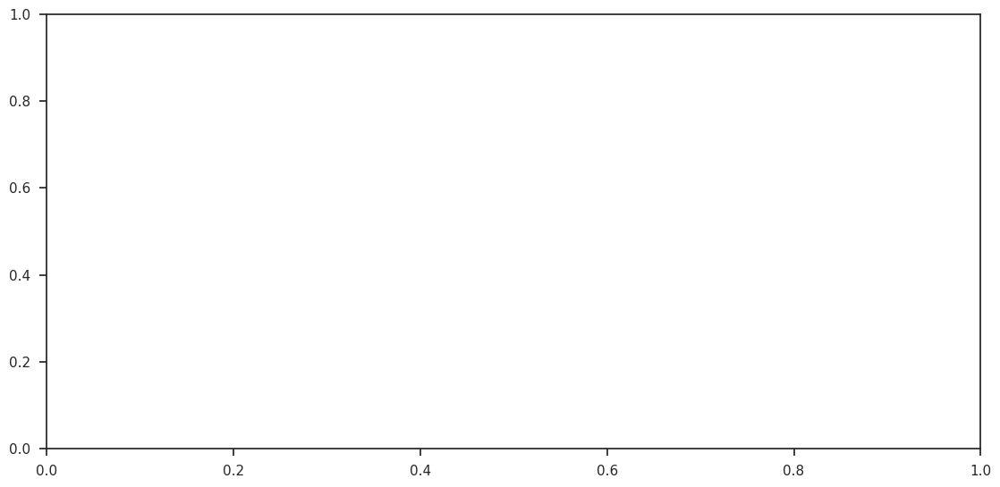

In [ ]:

#Low-Code PyCaret code
# Combine the predictor dataframe X and target dataframe y to get df1
df1 = df.loc[:,['N_Days', 'Prothrombin', 'Albumin', 'Age', 'Platelets', 'Bilirubin',
       'Cholesterol', 'Copper', 'Alk_Phos', 'Stage']]
# Initialize PyCaret
clf = setup(data=df1, target='Stage')

# Compare multiple models and select the best one
best_model = compare_models(sort='AUC')

# Tune the model using a grid search
tuned_model = tune_model(best_model)

# Evaluate the performance of the tuned model
evaluate_model(tuned_model)

# Train the best model on the entire dataset
final_model = finalize_model(tuned_model)


In [ ]:
# Show tuned_model
tuned_model

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=4656, verbose=0, warm_start=False)

In [ ]:
# Fit PyCaret classifier on training data
pycaret_clf = tuned_model.fit(x1_train, y1_train)

# Predict target values for test data
y1_hat = pycaret_clf.predict(x1_test)
y1_hat=pd.DataFrame(y1_hat)
cm = confusion_matrix(y1_test, y1_hat)
accuracy =  (cm[0,0] + cm[1,1])/( cm[0,0] + cm[0,1] + cm[1,0] + cm[1,1])
print("Confusion matrix\n",cm, "\n\nAccuracy = ",accuracy)

Confusion matrix
 [[51  6]
 [18  9]] 

Accuracy =  0.7142857142857143


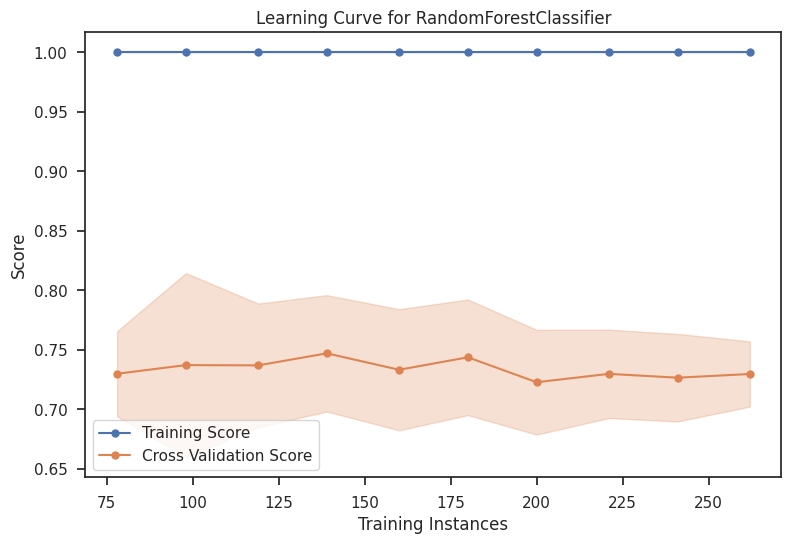

In [ ]:
plot_model(tuned_model, plot = 'learning', use_train_data = True)


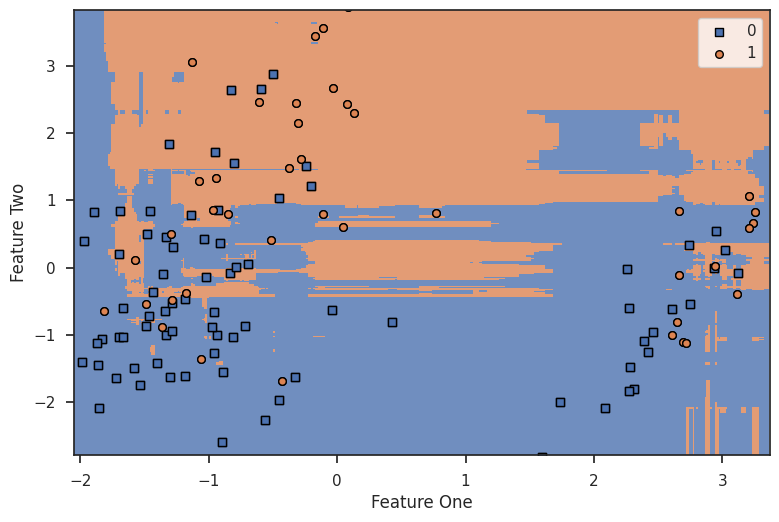

In [ ]:
# Decision boundary using low-code
plot_model(tuned_model, plot = 'boundary', use_train_data = True)


##*Scikit-learn Classifier*
(Not Important)

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, roc_auc_score
from sklearn.ensemble import RandomForestClassifier


grid = setup(data=df, target='Stage', html=False, verbose=True)
best = compare_models()
print(best)


# Preprocess the data
X = df.drop('Stage', axis=1)
y = df['Stage']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train the classifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Evaluate the classifier
y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred))
print("AUC-ROC score:", roc_auc_score(y_test, y_pred))


                    Description             Value
0                    Session id              1574
1                        Target             Stage
2                   Target type            Binary
3           Original data shape         (418, 25)
4        Transformed data shape         (418, 25)
5   Transformed train set shape         (292, 25)
6    Transformed test set shape         (126, 25)
7              Numeric features                24
8                    Preprocess              True
9               Imputation type            simple
10           Numeric imputation              mean
11       Categorical imputation              mode
12               Fold Generator   StratifiedKFold
13                  Fold Number                10
14                     CPU Jobs                -1
15                      Use GPU             False
16               Log Experiment             False
17              Experiment Name  clf-default-name
18                          USI              c05c


                                    Model  Accuracy     AUC  Recall   Prec.  \
ada                  Ada Boost Classifier    0.7637  0.7622  0.6045  0.6843   
rf               Random Forest Classifier    0.7399  0.7918  0.4664  0.7120   
lr                    Logistic Regression    0.7362  0.7871  0.4955  0.6659   
nb                            Naive Bayes    0.7359  0.7770  0.5236  0.6552   
ridge                    Ridge Classifier    0.7225  0.0000  0.4755  0.6401   
lda          Linear Discriminant Analysis    0.7122  0.7727  0.4855  0.6033   
lightgbm  Light Gradient Boosting Machine    0.7089  0.7567  0.5373  0.5952   
et                 Extra Trees Classifier    0.6918  0.7590  0.4455  0.5800   
xgboost         Extreme Gradient Boosting    0.6883  0.7478  0.5055  0.5628   
knn                K Neighbors Classifier    0.6816  0.6581  0.4664  0.5608   
gbc          Gradient Boosting Classifier    0.6782  0.7381  0.4864  0.5423   
dummy                    Dummy Classifier    0.6541 

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, roc_auc_score
from sklearn.ensemble import RandomForestClassifier

# Load the data
# Note: Replace 'data.csv' with the path to your dataset
grid = setup(data=df, target='Stage', html=False, verbose=True)
# Preprocess the data
X = df.drop('Stage', axis=1)
y = df['Stage']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train the classifier
clf = RandomForestClassifier(random_state=42)

# Set up the parameter grid for the grid search
param_grid = {
    'n_estimators': [10, 50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Perform a grid search for the best parameters
grid_search = GridSearchCV(clf, param_grid, scoring='roc_auc', cv=5, verbose=1, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Get the best model from the grid search
tuned_model = grid_search.best_estimator_

# Evaluate the classifier
y_pred = tuned_model.predict(X_test)
print(classification_report(y_test, y_pred))
print("AUC-ROC score:", roc_auc_score(y_test, y_pred))


                    Description             Value
0                    Session id              7062
1                        Target             Stage
2                   Target type            Binary
3           Original data shape         (418, 25)
4        Transformed data shape         (418, 25)
5   Transformed train set shape         (292, 25)
6    Transformed test set shape         (126, 25)
7              Numeric features                24
8                    Preprocess              True
9               Imputation type            simple
10           Numeric imputation              mean
11       Categorical imputation              mode
12               Fold Generator   StratifiedKFold
13                  Fold Number                10
14                     CPU Jobs                -1
15                      Use GPU             False
16               Log Experiment             False
17              Experiment Name  clf-default-name
18                          USI              fcc3


#**Classifier Horse Race**

In [ ]:
# Work with the set of predictors identified by RFE
best_predictors = rfe.support_              # identifies features used
new_features = []                           # X with selected features
for feature, predictor in list(zip(X, best_predictors)):
    if predictor == True:
        new_features.append(feature)

X = df[new_features]
X.shape

(418, 5)

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Perceptron, LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import balanced_accuracy_score, roc_auc_score
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

# Load the data
grid = setup(data=df, target='Stage', html=False, verbose=True)
# Preprocess the data
X = df.drop('Stage', axis=1)
y = df['Stage']

names = ["Perceptron", "Logistic Regression", "SVM (RBF kernel)", "Decision Tree", "Naive Bayes", "k Nearest Neighbors", "MLP", "Random Forest", "XG Boost", "Light GBM"]
classifiers = [
    Perceptron(random_state=1),
    LogisticRegression(),
    SVC(kernel="rbf", C=1),
    DecisionTreeClassifier(max_depth=5),
    GaussianNB(),
    KNeighborsClassifier(3),
    MLPClassifier(hidden_layer_sizes=(50,50),alpha=1, max_iter=1000),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    XGBClassifier(random_state=0, n_jobs=-1, learning_rate=0.1, n_estimators=100, max_depth=3),
    LGBMClassifier(boosting_type='gbdt', objective='binary', num_leaves=50, learning_rate=0.1, bagging_fraction=0.9, feature_fraction=0.9, reg_lambda=0.2)]

no_folds = 5
kf = StratifiedKFold(n_splits=no_folds, shuffle=True, random_state=12345)
for name, clf in zip(names, classifiers):
    print('CLASSIFIER: ',name,'\n')
    mean_accuracy = 0.0
    mean_balanced_accuracy = 0.0
    mean_auc = 0.0
    for fold, (train_index, test_index) in enumerate(kf.split(X,y),1):
        X_train, X_test = X.iloc[list(train_index)], X.iloc[list(test_index)]
        y_train, y_test = y.iloc[list(train_index)], y.iloc[list(test_index)]
        sm = SMOTE()
        X_train_SMOTE, y_train_SMOTE = sm.fit_resample(X_train, y_train)
        stdsc = StandardScaler()
        X_train_SMOTE_std = stdsc.fit_transform(X_train_SMOTE)
        X_test_std = stdsc.transform(X_test)
        clf.fit(X_train_SMOTE_std, y_train_SMOTE)
        y_pred = clf.predict(X_test_std)
        print(f'For fold {fold}:')
        print(f'Accuracy: {clf.score(X_test_std, y_test)}')
        print(f'Balanced Accuracy: {balanced_accuracy_score(y_test, y_pred)}')
        print(f'AUC: {roc_auc_score(y_test, y_pred)}')
        mean_accuracy = mean_accuracy + clf.score(X_test_std, y_test)
        mean_balanced_accuracy = mean_balanced_accuracy + balanced_accuracy_score(y_test, y_pred)
        mean_auc = mean_auc + roc_auc_score(y_test, y_pred)

    mean_accuracy = mean_accuracy / no_folds
    mean_balanced_accuracy = mean_balanced_accuracy / no_folds
    mean_auc = mean_auc / no_folds
    print('Average accuracy: %.3f Average balanced accuracy: %.3f Average AUC: %.3f\n\n' % (mean_accuracy, mean_balanced_accuracy, mean_auc))



                    Description             Value
0                    Session id              1829
1                        Target             Stage
2                   Target type            Binary
3           Original data shape         (418, 25)
4        Transformed data shape         (418, 25)
5   Transformed train set shape         (292, 25)
6    Transformed test set shape         (126, 25)
7              Numeric features                24
8                    Preprocess              True
9               Imputation type            simple
10           Numeric imputation              mean
11       Categorical imputation              mode
12               Fold Generator   StratifiedKFold
13                  Fold Number                10
14                     CPU Jobs                -1
15                      Use GPU             False
16               Log Experiment             False
17              Experiment Name  clf-default-name
18                          USI              6ce3


#**Logistic Regression Classifier**

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score, recall_score, accuracy_score, confusion_matrix
import numpy as np

# Standardize the training and testing datasets
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

# Get started with logistic regression (logit) classifier
clm = LogisticRegression(random_state=1, solver='sag', max_iter=1000, class_weight='balanced')
clm.fit(X_train_std, np.ravel(y_train))
y_pred = clm.predict(X_test_std)

# Print results
print('Logit: AUC = ', roc_auc_score(y_test, y_pred), ' recall =', recall_score(y_test, y_pred), ' accuracy = ', accuracy_score(y_test, y_pred))
print(confusion_matrix(y_true=y_test, y_pred=y_pred))
print("Logit Model Coefficients", list(clm.coef_))


Logit: AUC =  0.6460742544126598  recall = 0.6129032258064516  accuracy =  0.6547619047619048
[[36 17]
 [12 19]]
Logit Model Coefficients [array([-0.54799512,  0.47690634, -0.13172095, -0.54958201, -0.23674971,
        0.20717528,  0.57600362, -0.09600904, -0.11390361, -0.29670165,
        0.50385414, -0.09873976,  0.15429804,  0.02210101, -0.07428719,
        0.25983053, -0.37888552,  0.43331079, -0.04910447,  0.12316235,
        0.02754105, -0.22396185,  0.17220714,  0.12026988])]


In [ ]:
# Examine propensities of logit model
logit_propensities = pd.DataFrame(clm.predict_proba(X_test_std))

# Create a dataframe showing actuals, predicted, and propensities
y_pred = pd.DataFrame(y_pred)
y_pred.reset_index(drop = True , inplace = True)
y_test.reset_index(drop = True , inplace = True)
results = pd.concat([y_test, y_pred, logit_propensities[1]], axis=1)
results.columns= ['Actual','Predicted','Propensity']

#Compute percentage of instances with propensities in [lower_limit,upper_limit]
upper_limit = 0.7
lower_limit = 0.3
count = 0
for i in range(0,len(logit_propensities[1])):
  if((logit_propensities.loc[i,1] >= lower_limit) & (logit_propensities.loc[i,1] <= upper_limit)):
    count = count + 1
print('Percentage of test instances with propensity in [%1.2f, %1.2f]: %3.2f' % (lower_limit,upper_limit,100 * count/len(logit_propensities[1])))

# Show instances where predicted and actual differ
print('Instances for which actual and predicted differ:')
discrepancies = results.loc[results['Actual'] != results['Predicted']]
discrepancies


Percentage of test instances with propensity in [0.30, 0.70]: 38.10
Instances for which actual and predicted differ:


,Actual,Predicted,Propensity
0,0,1,0.585783
3,0,1,0.821671
4,0,1,0.872515
8,0,1,0.689418
9,0,1,0.504902
11,0,1,0.778537
13,1,0,0.406691
14,0,1,0.856421
15,1,0,0.215939
19,0,1,0.520927


Test Accuracy: 0.679
[[51  2]
 [25  6]]


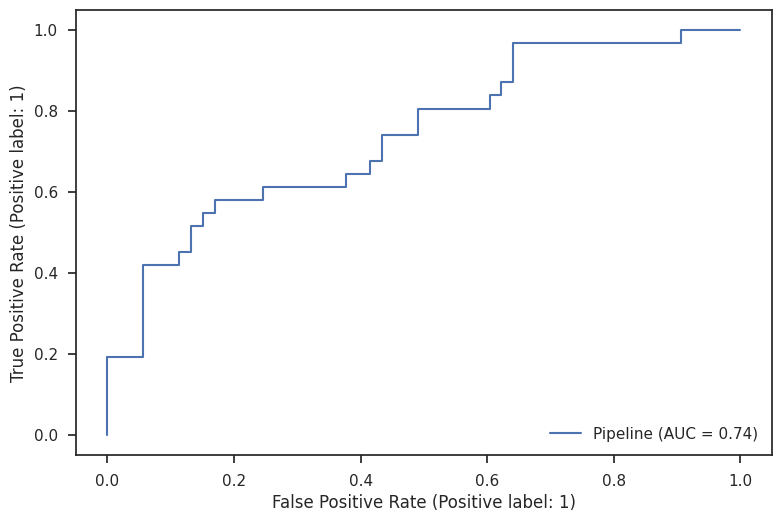

In [ ]:
# In pursuit of a competitive model with a much smaller number of predictors, create a pipeline that scales, performs PCA, and fits and scores a logit model
# Use weights to a) offset the effect of the imbalance in the target column (212 M out of 569 total), and b) emphasize that a false negative may be much worse than a false positive

weights = {0:0.8, 1:0.2} # The weights are supposed to penalize errors in the classes. So, if we think false positives are 4 times "worse" than false negatives
                         # we should set the weights to be {0:0.2, 1:0.8}. But the implementation in sklearn appears to be backwards, so experiment with this
pipe_lr = make_pipeline(StandardScaler(),
                        PCA(n_components=5),
                        LogisticRegression(random_state=1,solver='sag',class_weight=weights))

pipe_lr.fit(X_train_std, np.ravel(y_train))
y_pred = pipe_lr.predict(X_test_std)
print('Test Accuracy: %.3f' % pipe_lr.score(X_test_std, y_test))
print(confusion_matrix(y_test,y_pred,labels=[0,1]))                           # Confusion matrix
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_estimator(
        pipe_lr, X_test_std, y_test,
    )


In [ ]:
# Review propensities and misclassifications from PCA solution
pipe_lr_propensities = pd.DataFrame(clm.predict_proba(X_test_std))

# Create a dataframe showing actuals, predicted, and propensities
y_pred = pd.DataFrame(y_pred)
y_pred.reset_index(drop = True , inplace = True)
y_test.reset_index(drop = True , inplace = True)
results = pd.concat([y_test, y_pred, pipe_lr_propensities[1]], axis=1)
results.columns= ['Actual','Predicted','Propensity']

#Compute percentage of instances with propensities in [lower_limit,upper_limit]
upper_limit = 0.7
lower_limit = 0.3
count = 0
for i in range(0,len(pipe_lr_propensities[1])):
  if((pipe_lr_propensities.loc[i,1] >= lower_limit) & (pipe_lr_propensities.loc[i,1] <= upper_limit)):
    count = count + 1
print('Percentage of test instances with propensity in [%1.2f, %1.2f]: %3.2f' % (lower_limit,upper_limit,100 * count/len(pipe_lr_propensities[1])))

# Show instances where predicted and actual differ
print('Instances for which actual and predicted differ:')
discrepancies = results.loc[results['Actual'] != results['Predicted']]
discrepancies


Percentage of test instances with propensity in [0.30, 0.70]: 38.10
Instances for which actual and predicted differ:


,Actual,Predicted,Propensity
2,1,0,0.625994
4,0,1,0.872515
7,1,0,0.725365
13,1,0,0.406691
15,1,0,0.215939
17,1,0,0.844489
20,1,0,0.414463
21,1,0,0.438284
23,1,0,0.477521
27,1,0,0.850740


In [ ]:
# Add cross-validation
weights = {0:0.2, 1:0.8} # The weights are supposed to penalize errors in the classes. So, if we think false positives are 4 times "worse" than false negatives
                         # we should set the weights to be {0:0.2, 1:0.8}. But the implementation in sklearn appears to be backwards, so experiment with this
pipe_lr = make_pipeline(StandardScaler(),
                        PCA(n_components=5),
                        LogisticRegression(random_state=1,solver='sag',class_weight=weights))

scores = cross_val_score(pipe_lr, X, y, cv=5, n_jobs = -1,scoring='roc_auc')
print('CV AUC scores: {}'.format(scores))
print('CV AUC mean: {} and std deviation: {}'.format(np.mean(scores), np.std(scores)))

scores = cross_val_score(pipe_lr, X, y, cv=5, n_jobs = -1,scoring='recall')
print('CV recall scores: {}'.format(scores))
print('CV recall mean: {} and std deviation: {}'.format(np.mean(scores), np.std(scores)))

scores = cross_val_score(pipe_lr, X, y, cv=5, n_jobs = -1)
print('CV accuracy scores: {}'.format(scores))
print('CV accuracy mean: {} and std deviation: {}'.format(np.mean(scores), np.std(scores)))

CV AUC scores: [0.79811912 0.81128527 0.69780564 0.73180077 0.6987013 ]
CV AUC mean: 0.7475424192665572 and std deviation: 0.04843171502229019
CV recall scores: [0.75862069 0.93103448 0.86206897 0.96551724 1.        ]
CV recall mean: 0.903448275862069 and std deviation: 0.0855839561792473
CV accuracy scores: [0.67857143 0.67857143 0.57142857 0.5060241  0.39759036]
CV accuracy mean: 0.5664371772805508 and std deviation: 0.10708135430731082


#**Winner Classifier**

Based on above analysis, the classifier with the highest average accuracy, balanced accuracy, and AUC is the XG Boost classifier, so we are choosing that classifier.

In [ ]:
# Create an XGBoost pipeline with SMOTE and StandardScaler and then gridsearch it using five cross-validation folds
# Execution takes ~13 minutes using Colab Pro. Reduce the number of parameters and levels of each parameter to speed up execution
model = imbpipeline([
        ('sample', SMOTE()),
        ('std', StandardScaler()),
        ('clf', XGBClassifier(objective='binary:logistic',
                          booster='gbtree',
                          eval_metric='auc',
                          tree_method='hist',
                          grow_policy='lossguide',
                          use_label_encoder=False))])

param_grid = {
    'clf__max_depth': range (2, 10, 1),
    'clf__n_estimators': range(60, 220, 40),
    'clf__gamma': [1,5,10],
    'clf__learning_rate': [0.1, 0.05, 0.01, 0.005]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, cv = 5, scoring = 'roc_auc')
grid.fit(X, y)
print(grid.best_params_)
print(grid.best_estimator_)

{'clf__gamma': 1, 'clf__learning_rate': 0.1, 'clf__max_depth': 2, 'clf__n_estimators': 140}
Pipeline(memory=None,
         steps=[('sample',
                 SMOTE(k_neighbors=5, n_jobs=None, random_state=None,
                       sampling_strategy='auto')),
                ('std',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('clf',
                 XGBClassifier(base_score=None, booster='gbtree',
                               callbacks=None, colsample_bylevel=None,
                               colsample_bynode=None, colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_ca...
                               grow_policy='lossguide', importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=

#**Generating Propensities**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=54321, stratify=y)

In [ ]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split

# Generate a synthetic imbalanced dataset
X, y = make_classification(n_classes=2, class_sep=2,
                           weights=[0.1, 0.9], n_informative=3,
                           n_redundant=1, flip_y=0, n_features=20,
                           n_clusters_per_class=1, n_samples=1000,
                           random_state=10)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Oversampling using SMOTE
oversample = SMOTE()
X_train_oversampled, y_train_oversampled = oversample.fit_resample(X_train, y_train)

# Undersampling using RandomUnderSampler
undersample = RandomUnderSampler()
X_train_undersampled, y_train_undersampled = undersample.fit_resample(X_train, y_train)

In [ ]:
from collections import Counter

# Original class distribution
counter_original = Counter(y_train)
print("Original class distribution:", counter_original)

# SMOTE oversampled class distribution
counter_oversampled = Counter(y_train_oversampled)
print("SMOTE oversampled class distribution:", counter_oversampled)

# RandomUnderSampler undersampled class distribution
counter_undersampled = Counter(y_train_undersampled)
print("RandomUnderSampler undersampled class distribution:", counter_undersampled)


Original class distribution: Counter({1: 723, 0: 77})
SMOTE oversampled class distribution: Counter({1: 723, 0: 723})
RandomUnderSampler undersampled class distribution: Counter({0: 77, 1: 77})


In [ ]:
imbalance_ratio = counter_original[0] / counter_original[1]
print(f"Imbalance ratio (class 0 / class 1) in the original dataset: {imbalance_ratio:.2f}")

Imbalance ratio (class 0 / class 1) in the original dataset: 0.11


In [ ]:
# SMOTE (oversampling)
# Data is unbalanced (38.54% converted instances)

import imblearn
print("imblearn version: ", imblearn.__version__)

from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state=12346)
X_train_SMOTE, y_train_SMOTE = sm.fit_resample(X_train, y_train)

print("Shape before SMOTE: ", X_train.shape, y_train.shape, "\n")
print("Shape after SMOTE: ", X_train_SMOTE.shape, y_train_SMOTE.shape, "\n")

imblearn version:  0.10.1
Shape before SMOTE:  (800, 20) (800,) 

Shape after SMOTE:  (1446, 20) (1446,) 



In [ ]:
# Standardization z-score  (https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html#sklearn.preprocessing.StandardScaler)
# from sklearn.preprocessing import StandardScaler
stdsc = StandardScaler()
X_train_SMOTE_std = stdsc.fit_transform(X_train_SMOTE)
X_test_std = stdsc.transform(X_test)

In [ ]:
#Fit best XGBoost model, predict test data
clf = XGBClassifier(objective='binary:logistic',
                          booster='gbtree',
                          eval_metric='auc',
                          tree_method='hist',
                          grow_policy='lossguide',
                          use_label_encoder=False,
                          gamma=5,
                          learning_rate=0.05,
                          max_depth=5)
clf.fit(X_train_SMOTE_std,y_train_SMOTE)
y_pred = clf.predict(X_test_std)
print(f'AUC: {roc_auc_score(y_test, y_pred)}')
print(f'Accuracy: {clf.score(X_test_std, y_test)}')

AUC: 0.9782608695652174
Accuracy: 0.995


In [ ]:
# Reporting
print(confusion_matrix(y_test, y_pred))
print("Accuracy = ",accuracy_score(y_test, y_pred))
print("Recall = ",recall_score(y_test, y_pred))

[[ 22   1]
 [  0 177]]
Accuracy =  0.995
Recall =  1.0


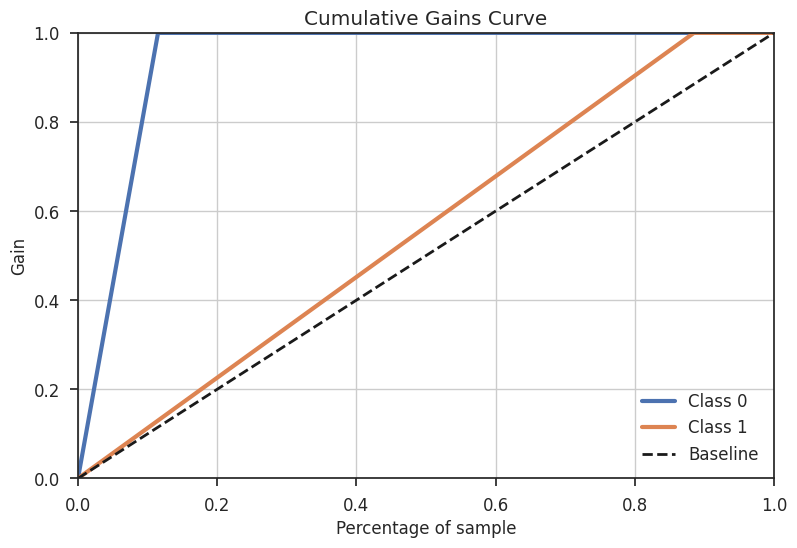

Analysis: 80% of first 176  instances rank-ordered by propensity are positive actuals in test dataset of size  200
Percentage of rank-ordered data to take as leads:  88.0
LEADS:



,Actual,Predicted,Propensity
0,1,1,0.994817
1,1,1,0.994817
2,1,1,0.994817
3,1,1,0.994817
4,1,1,0.994817
...,...,...,...
172,1,1,0.994817
173,1,1,0.994817
174,1,1,0.991182
175,1,1,0.864842


In [ ]:
import scikitplot as skplt

# First, compute the propensities of instances in the test dataset
clf_propensities = pd.DataFrame(clf.predict_proba(X_test_std))

# Create a dataframe showing actuals, predicted, and propensities
y_pred = pd.DataFrame(y_pred)
y_pred.reset_index(drop=True, inplace=True)
y_test_df = pd.DataFrame(y_test)  # Convert y_test to a DataFrame
y_test_df.reset_index(drop=True, inplace=True)
results = pd.concat([y_test_df, y_pred, clf_propensities[1]], axis=1)
results.columns = ['Actual', 'Predicted', 'Propensity']

# Sort the instances in results by propensity
results.sort_values(by=['Propensity'], inplace=True, ascending=False)
results.reset_index(drop=True, inplace=True)

# Plot gains chart
skplt.metrics.plot_cumulative_gain(y_test, clf_propensities)
plt.show()

# Find the top-rated instances in results such that the actual positive label for 'Converted' of those instances is greater than or equal to 80%
# We will assume the first lead has a positive actual
index = 2
n = 1
fraction = 1
while ((index < len(results)) & (fraction >= 0.8)):
    if results.loc[index, 'Actual'] == 1:
        n = n+1
    fraction = n/index
    index = index + 1

print('Analysis: 80% of first', n, ' instances rank-ordered by propensity are positive actuals in test dataset of size ', len(results))
print('Percentage of rank-ordered data to take as leads: ', 100*n/len(results))
print('LEADS:\n')
results.loc[:n]


In [ ]:
# Add cross-validation
weights = {0:0.2, 1:0.8} # The weights are supposed to penalize errors in the classes. So, if we think false positives are 4 times "worse" than false negatives
                         # we should set the weights to be {0:0.2, 1:0.8}. But the implementation in sklearn appears to be backwards, so experiment with this
pipe_lr = make_pipeline(StandardScaler(),
                        PCA(n_components=5),
                        LogisticRegression(random_state=1,solver='sag',class_weight=weights))

scores = cross_val_score(pipe_lr, X, y, cv=5, n_jobs = -1,scoring='roc_auc')
print('CV AUC scores: {}'.format(scores))
print('CV AUC mean: {} and std deviation: {}'.format(np.mean(scores), np.std(scores)))

scores = cross_val_score(pipe_lr, X, y, cv=5, n_jobs = -1,scoring='recall')
print('CV recall scores: {}'.format(scores))
print('CV recall mean: {} and std deviation: {}'.format(np.mean(scores), np.std(scores)))

scores = cross_val_score(pipe_lr, X, y, cv=5, n_jobs = -1)
print('CV accuracy scores: {}'.format(scores))
print('CV accuracy mean: {} and std deviation: {}'.format(np.mean(scores), np.std(scores)))

CV AUC scores: [0.79811912 0.81128527 0.69780564 0.73180077 0.6987013 ]
CV AUC mean: 0.7475424192665572 and std deviation: 0.04843171502229019
CV recall scores: [0.75862069 0.93103448 0.86206897 0.96551724 1.        ]
CV recall mean: 0.903448275862069 and std deviation: 0.0855839561792473
CV accuracy scores: [0.67857143 0.67857143 0.57142857 0.5060241  0.39759036]
CV accuracy mean: 0.5664371772805508 and std deviation: 0.10708135430731082


##**Learning Curve**
Between the Logistic Regression Classifier and XGBoost classifier

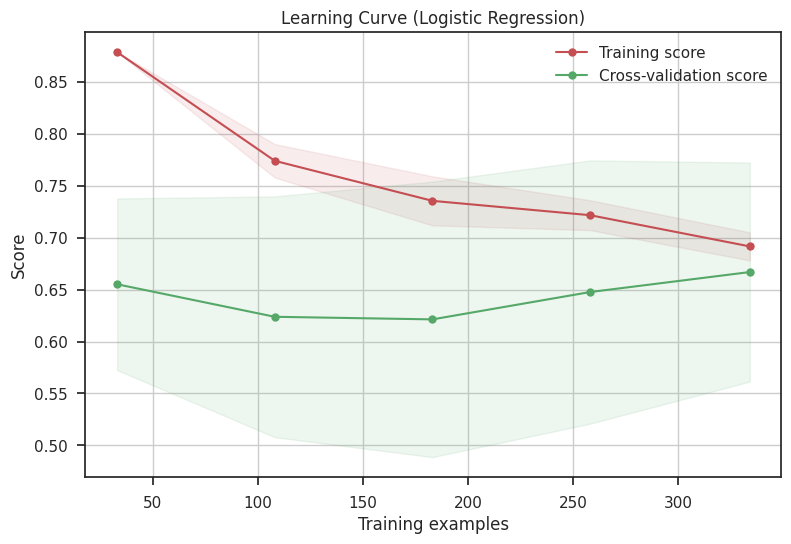

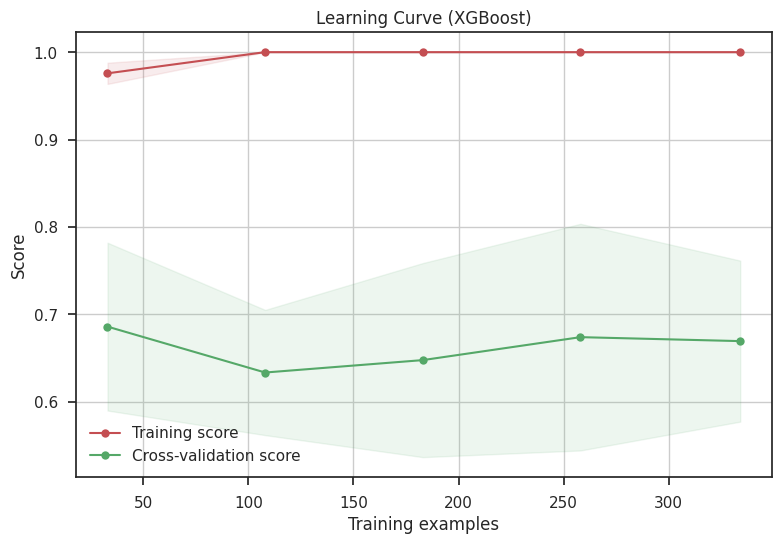

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier

def plot_learning_curve(estimator, title, X, y, cv=None, n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")

    plt.legend(loc="best")
    return plt

# Standardize the dataset
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# Logistic Regression Classifier
logreg = LogisticRegression(random_state=1, solver='sag', max_iter=1000, class_weight='balanced')

# XGBoost Classifier
xgb_clf = XGBClassifier(objective='binary:logistic', booster='gbtree', eval_metric='auc', tree_method='hist', grow_policy='lossguide', use_label_encoder=False)

# Plot learning curves
plot_learning_curve(logreg, "Learning Curve (Logistic Regression)", X_std, y, cv=5, n_jobs=-1)
plot_learning_curve(xgb_clf, "Learning Curve (XGBoost)", X_std, y, cv=5, n_jobs=-1)

plt.show()


#**Conclusions**
The Perceptron, Logistic Regression, "SVM (RBF kernel), Decision Tree, Naive Bayes, k Nearest Neighbors, Multilayer Perceptron, Random Forest, XG Boost, and LightGBM classifiers were used in an artificial horse race. Based on the AUC statistic, XGBoost was chosen as the winner and subsequently tweaked. Both average accuracy and average AUC are 0.713.

Ten predictors found using Recursive Feature Elimination were used to build the model. The data underwent SMOTE and normalization treatments.
According to the study, in the test dataset of size 200, 80% of the first 176 instances rank-ordered by propensity are positive actuals, and 88.0 percent of the rank-ordered data should be taken as leads.
